# PyORBIT output.mat comparison
08: Full simulation scan using measured tomo longitudinal distribution including the injection bump tune swing modelled by including a sextupole field in the BSW injection bump dipoles

In [1]:
import os
import glob
import imageio
import pickle
import pandas as pd
import numpy as np
import PyNAFF as pnf
import scipy.io as sio 
import matplotlib.cm as cm
from math import log10, floor
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy.optimize import curve_fit

In [2]:
plt.rcParams['figure.figsize'] = [9.0, 8.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14

plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

plt.rcParams['font.size'] = 10
plt.rcParams['legend.fontsize'] = 8

plt.rcParams['lines.linewidth'] = 1
plt.rcParams['lines.markersize'] = 5

In [3]:
def round_sig(x, sig=3):
        return round(x, sig-int(floor(log10(abs(x))))-1)

def replace_point_with_p(input_str):
        return input_str.replace(".", "p")
    
def is_non_zero_file(fpath):  
        print '\n\t\t\tis_non_zero_file:: Checking file ', fpath
        print '\n\t\t\tis_non_zero_file:: File exists = ', os.path.isfile(fpath)
        print '\n\t\t\tis_non_zero_file:: Size > 3 bytes = ', os.path.getsize(fpath)
        return os.path.isfile(fpath) and os.path.getsize(fpath) > 3

In [4]:
def add_input_file(dd, filename, label):
	f = filename
	p = dict()
	sio.loadmat(f, mdict=p)
	dd[label] = p	
	print '\tAdded output data from ', filename, '\t dictionary key: ', label
	return dd

In [5]:
def make_directory(path):
    try:
        os.mkdir(path)
    except OSError:
        print ("Creation of the directory %s failed" % path)
    else:
        print ("Successfully created the directory %s " % path)  

In [6]:
dd1 = dict() # NoSC H
dd2 = dict() # SC H
dd3 = dict() # NoSC V
dd4 = dict() # SC V

dd1 = add_input_file(dd1, '0_H_07/PyORBIT/output/output.mat', '6.07')
dd1 = add_input_file(dd1, '0_H_08/PyORBIT/output/output.mat', '6.08')
dd1 = add_input_file(dd1, '0_H_09/PyORBIT/output/output.mat', '6.09')
dd1 = add_input_file(dd1, '0_H_10/PyORBIT/output/output.mat', '6.10')
dd1 = add_input_file(dd1, '0_H_11/PyORBIT/output/output.mat', '6.11')
dd1 = add_input_file(dd1, '0_H_12/PyORBIT/output/output.mat', '6.12')
dd1 = add_input_file(dd1, '0_H_13/PyORBIT/output/output.mat', '6.13')
dd1 = add_input_file(dd1, '0_H_14/PyORBIT/output/output.mat', '6.14')
dd1 = add_input_file(dd1, '0_H_15/PyORBIT/output/output.mat', '6.15')
dd1 = add_input_file(dd1, '0_H_16/PyORBIT/output/output.mat', '6.16')
dd1 = add_input_file(dd1, '0_H_17/PyORBIT/output/output.mat', '6.17')
dd1 = add_input_file(dd1, '0_H_18/PyORBIT/output/output.mat', '6.18')
dd1 = add_input_file(dd1, '0_H_19/PyORBIT/output/output.mat', '6.19')
dd1 = add_input_file(dd1, '0_H_20/PyORBIT/output/output.mat', '6.20')
dd1 = add_input_file(dd1, '0_H_21/PyORBIT/output/output.mat', '6.21')

dd2 = add_input_file(dd2, '1_H_07/PyORBIT/output/output.mat', '6.07')
dd2 = add_input_file(dd2, '1_H_08/PyORBIT/output/output.mat', '6.08')
dd2 = add_input_file(dd2, '1_H_09/PyORBIT/output/output.mat', '6.09')
dd2 = add_input_file(dd2, '1_H_10/PyORBIT/output/output.mat', '6.10')
dd2 = add_input_file(dd2, '1_H_11/PyORBIT/output/output.mat', '6.11')
dd2 = add_input_file(dd2, '1_H_12/PyORBIT/output/output.mat', '6.12')
dd2 = add_input_file(dd2, '1_H_13/PyORBIT/output/output.mat', '6.13')
dd2 = add_input_file(dd2, '1_H_14/PyORBIT/output/output.mat', '6.14')
dd2 = add_input_file(dd2, '1_H_15/PyORBIT/output/output.mat', '6.15')
dd2 = add_input_file(dd2, '1_H_16/PyORBIT/output/output.mat', '6.16')
dd2 = add_input_file(dd2, '1_H_17/PyORBIT/output/output.mat', '6.17')
dd2 = add_input_file(dd2, '1_H_18/PyORBIT/output/output.mat', '6.18')
dd2 = add_input_file(dd2, '1_H_19/PyORBIT/output/output.mat', '6.19')
dd2 = add_input_file(dd2, '1_H_20/PyORBIT/output/output.mat', '6.20')
dd2 = add_input_file(dd2, '1_H_21/PyORBIT/output/output.mat', '6.21')

dd3 = add_input_file(dd3, '0_V_10/PyORBIT/output/output.mat', '6.10')
dd3 = add_input_file(dd3, '0_V_11/PyORBIT/output/output.mat', '6.11')
dd3 = add_input_file(dd3, '0_V_12/PyORBIT/output/output.mat', '6.12')
dd3 = add_input_file(dd3, '0_V_13/PyORBIT/output/output.mat', '6.13')
dd3 = add_input_file(dd3, '0_V_14/PyORBIT/output/output.mat', '6.14')
dd3 = add_input_file(dd3, '0_V_15/PyORBIT/output/output.mat', '6.15')
dd3 = add_input_file(dd3, '0_V_16/PyORBIT/output/output.mat', '6.16')
dd3 = add_input_file(dd3, '0_V_17/PyORBIT/output/output.mat', '6.17')
dd3 = add_input_file(dd3, '0_V_18/PyORBIT/output/output.mat', '6.18')
dd3 = add_input_file(dd3, '0_V_19/PyORBIT/output/output.mat', '6.19')
dd3 = add_input_file(dd3, '0_V_20/PyORBIT/output/output.mat', '6.20')
dd3 = add_input_file(dd3, '0_V_21/PyORBIT/output/output.mat', '6.21')
dd3 = add_input_file(dd3, '0_V_22/PyORBIT/output/output.mat', '6.22')
dd3 = add_input_file(dd3, '0_V_23/PyORBIT/output/output.mat', '6.23')
dd3 = add_input_file(dd3, '0_V_24/PyORBIT/output/output.mat', '6.24')

dd4 = add_input_file(dd4, '1_V_10/PyORBIT/output/output.mat', '6.10')
dd4 = add_input_file(dd4, '1_V_11/PyORBIT/output/output.mat', '6.11')
dd4 = add_input_file(dd4, '1_V_12/PyORBIT/output/output.mat', '6.12')
dd4 = add_input_file(dd4, '1_V_13/PyORBIT/output/output.mat', '6.13')
dd4 = add_input_file(dd4, '1_V_14/PyORBIT/output/output.mat', '6.14')
dd4 = add_input_file(dd4, '1_V_15/PyORBIT/output/output.mat', '6.15')
dd4 = add_input_file(dd4, '1_V_16/PyORBIT/output/output.mat', '6.16')
dd4 = add_input_file(dd4, '1_V_17/PyORBIT/output/output.mat', '6.17')
dd4 = add_input_file(dd4, '1_V_18/PyORBIT/output/output.mat', '6.18')
dd4 = add_input_file(dd4, '1_V_19/PyORBIT/output/output.mat', '6.19')
dd4 = add_input_file(dd4, '1_V_20/PyORBIT/output/output.mat', '6.20')
dd4 = add_input_file(dd4, '1_V_21/PyORBIT/output/output.mat', '6.21')
dd4 = add_input_file(dd4, '1_V_22/PyORBIT/output/output.mat', '6.22')
dd4 = add_input_file(dd4, '1_V_23/PyORBIT/output/output.mat', '6.23')
dd4 = add_input_file(dd4, '1_V_24/PyORBIT/output/output.mat', '6.24')


	Added output data from  0_H_07/PyORBIT/output/output.mat 	 dictionary key:  6.07
	Added output data from  0_H_08/PyORBIT/output/output.mat 	 dictionary key:  6.08
	Added output data from  0_H_09/PyORBIT/output/output.mat 	 dictionary key:  6.09
	Added output data from  0_H_10/PyORBIT/output/output.mat 	 dictionary key:  6.10
	Added output data from  0_H_11/PyORBIT/output/output.mat 	 dictionary key:  6.11
	Added output data from  0_H_12/PyORBIT/output/output.mat 	 dictionary key:  6.12
	Added output data from  0_H_13/PyORBIT/output/output.mat 	 dictionary key:  6.13
	Added output data from  0_H_14/PyORBIT/output/output.mat 	 dictionary key:  6.14
	Added output data from  0_H_15/PyORBIT/output/output.mat 	 dictionary key:  6.15
	Added output data from  0_H_16/PyORBIT/output/output.mat 	 dictionary key:  6.16
	Added output data from  0_H_17/PyORBIT/output/output.mat 	 dictionary key:  6.17
	Added output data from  0_H_18/PyORBIT/output/output.mat 	 dictionary key:  6.18
	Added output da

In [7]:
dd1['6.07'].keys()

['eps_z',
 'D_x',
 'D_y',
 'kurtosis_yp_6sig',
 'kurtosis_yp',
 'mu_yp',
 'kurtosis_z_6sig',
 'eff_beta_y',
 'eff_beta_x',
 'eff_alpha_y',
 'kurtosis_y_6sig',
 'epsn_y',
 'epsn_x',
 'beta_y',
 'beta_x',
 'dpp_rms',
 'sig_yp',
 'min_dE',
 'orbit_x_max',
 'turn_time',
 'n_mp',
 'min_xp',
 'orbit_x_min',
 'kurtosis_y',
 'kurtosis_xp_6sig',
 'alpha_x',
 'alpha_y',
 'bunchlength',
 '__header__',
 'sig_xp',
 'kurtosis_dE_6sig',
 'kurtosis_xp',
 'max_xp',
 'intensity',
 'min_yp',
 'sig_dE',
 'min_x',
 'mu_z',
 'min_z',
 'mu_x',
 'cumulative_time',
 'mean_yp',
 'Qy',
 'eff_epsn_y',
 'eff_epsn_x',
 'mean_x',
 'mean_y',
 'mean_z',
 'kurtosis_x_6sig',
 '__version__',
 'max_z',
 'mu_dE',
 'max_x',
 'max_y',
 'mean_dE',
 'Qx',
 'sig_z',
 'sig_y',
 'sig_x',
 'max_yp',
 'kurtosis_z',
 'eff_alpha_x',
 'kurtosis_x',
 'mu_xp',
 'turn_duration',
 'min_y',
 'mean_xp',
 'mu_y',
 'kurtosis_dE',
 'orbit_y_max',
 'orbit_y_min',
 '__globals__',
 'turn',
 'max_dE',
 'gamma']

In [8]:
make_directory('SC_NoSC_Plots')

Creation of the directory SC_NoSC_Plots failed


In [9]:
sc = 'SbS'
legend_label1 = r'$Q_x$'  
legend_label2 = r'$Q_y$'   
main_label = 'MD4224_Light'
main_label2 = main_label + '_zoom'
scaled_label = main_label + '_scaled'
turn_tot = 2200
zoom_turns = 30
turns = [0, 1, 10, 50, 100, 874, 2185, 2199]
#betagamma = 2.492104532 * 0.9159915293879255
save_folder = 'SC_NoSC_Plots'
title_2 = 'Injection Bump, Space Charge: OFF'
title_1 = 'Injection Bump, Space Charge: ON'
case_label_1 = r'Horizontal Scan ($Q_y$ = 6.24)'
case_label_2 = r'Vertical Scan ($Q_x$ = 6.21)'

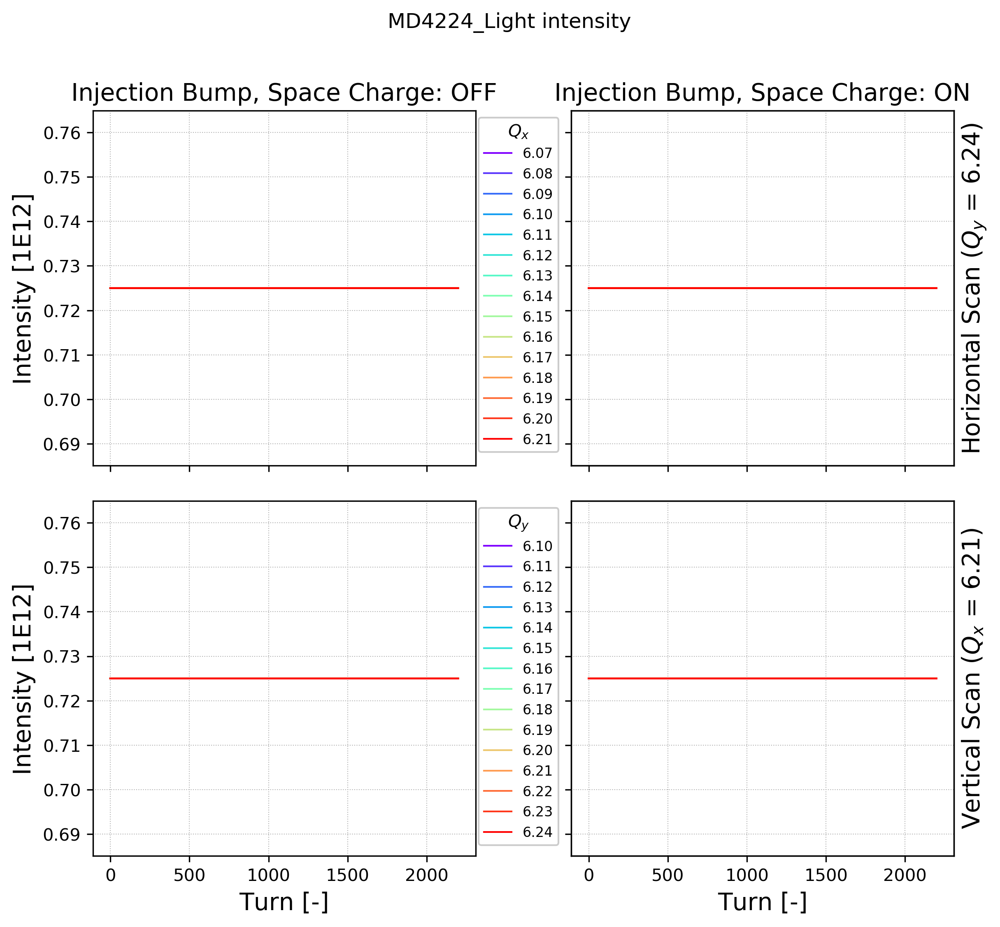

In [10]:
parameter = 'intensity'
multi1 = 1E-12

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Intensity [1E12]');
ax3.set_ylabel('Intensity [1E12]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

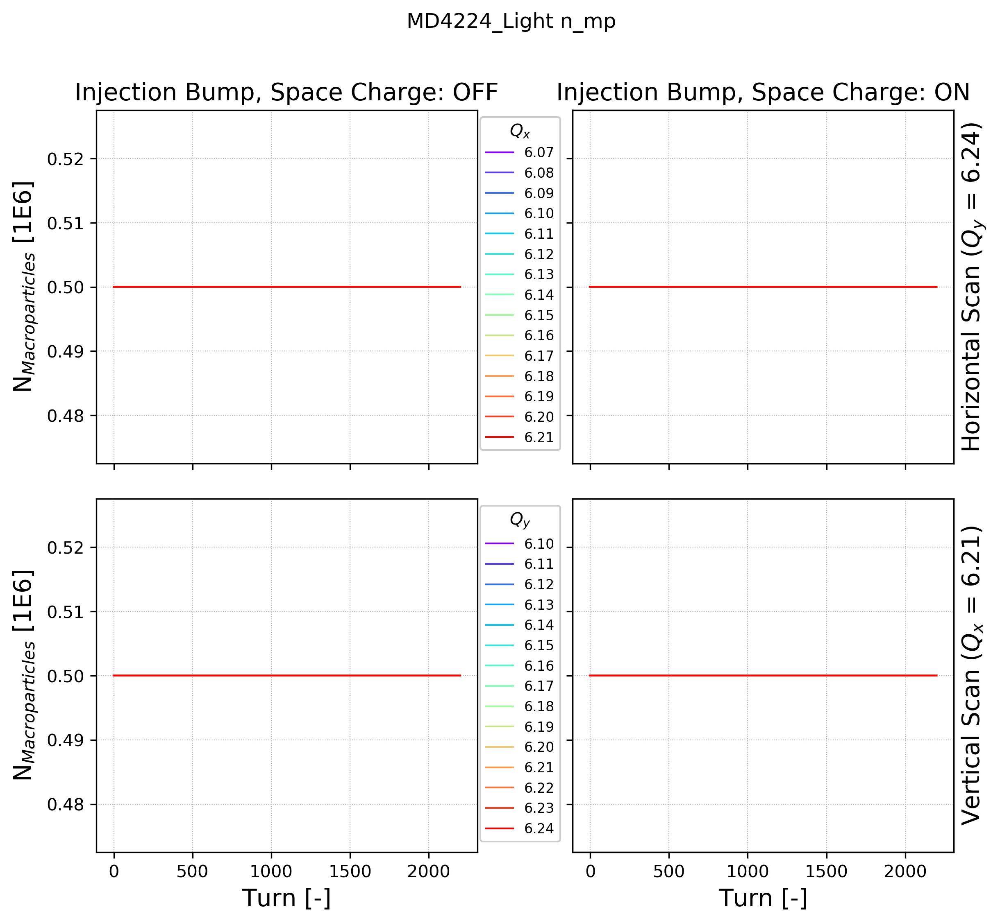

In [11]:
parameter = 'n_mp'
multi1 = 1E-6

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'N$_{Macroparticles}$ [1E6]');
ax3.set_ylabel(r'N$_{Macroparticles}$ [1E6]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

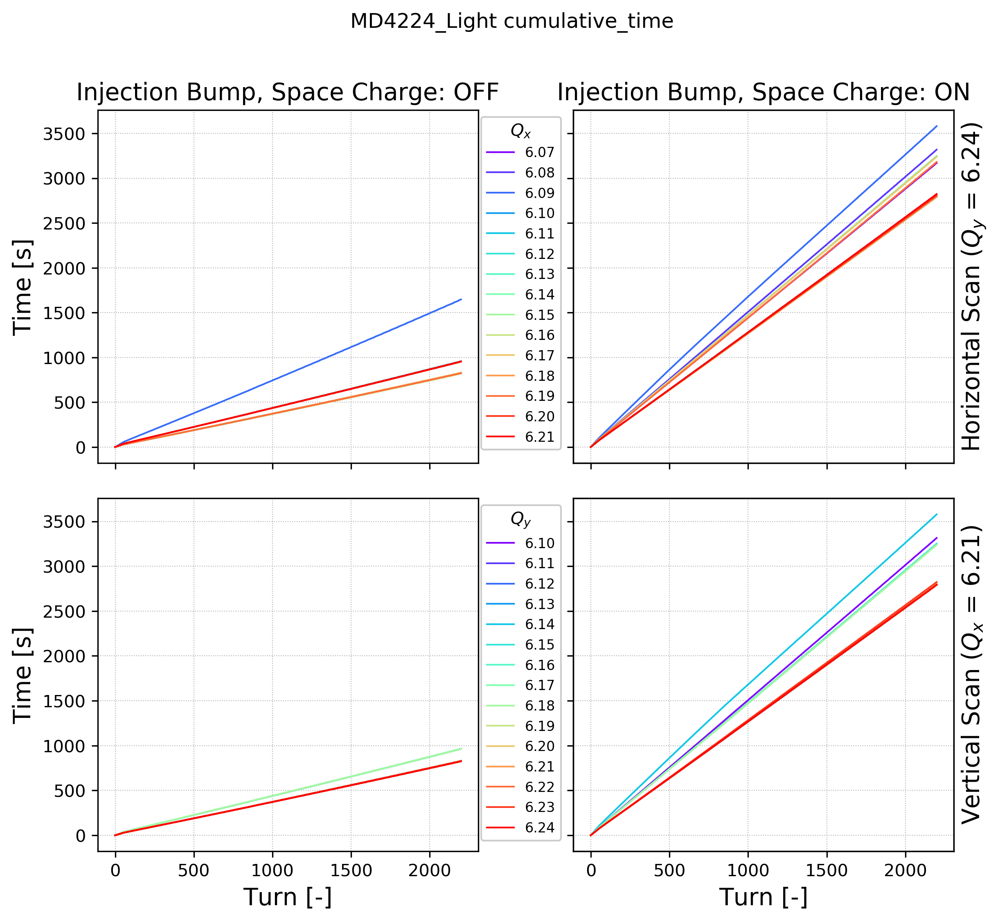

In [12]:
parameter = 'cumulative_time'
multi1 = 1./60.

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Time [s]');
ax3.set_ylabel('Time [s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax6 = ax4.twinx()
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

ax5.set_ylabel(case_label_1);
ax6.set_ylabel(case_label_2);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

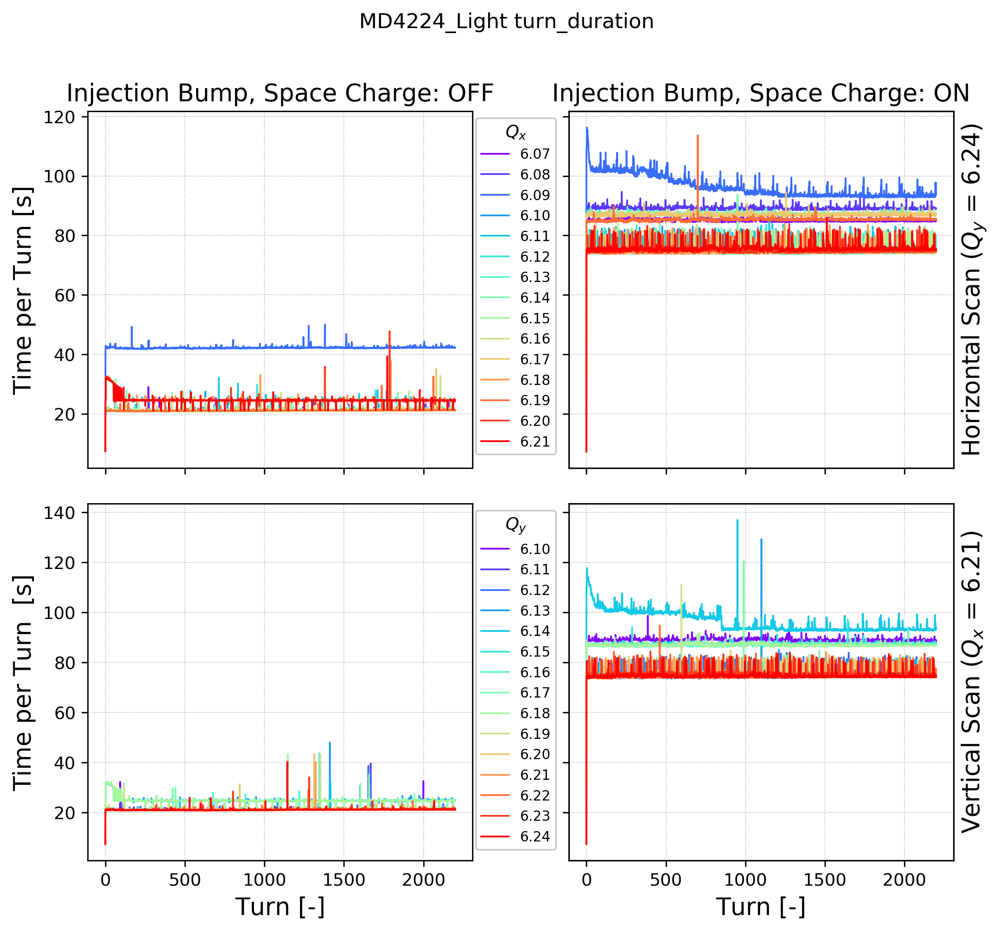

In [13]:
parameter = 'turn_duration'
multi1 = 1

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Time per Turn [s]');
ax3.set_ylabel('Time per Turn  [s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax6 = ax4.twinx()
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_x  =  4.42  range =  0.602  =  13.6 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_x  =  4.37  range =  0.515  =  11.8 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_x  =  4.23  range =  0.42  =  9.95 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_x  =  4.27  range =  0.365  =  8.56 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_x  =  4.29  range =  0.315  =  7.35 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_x  =  4.19  range =  0.324  =  7.74 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_x  =  4.26  range =  0.298  =  6.99 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_x  =  4.22  range =  0.204  =  4.84 %
I

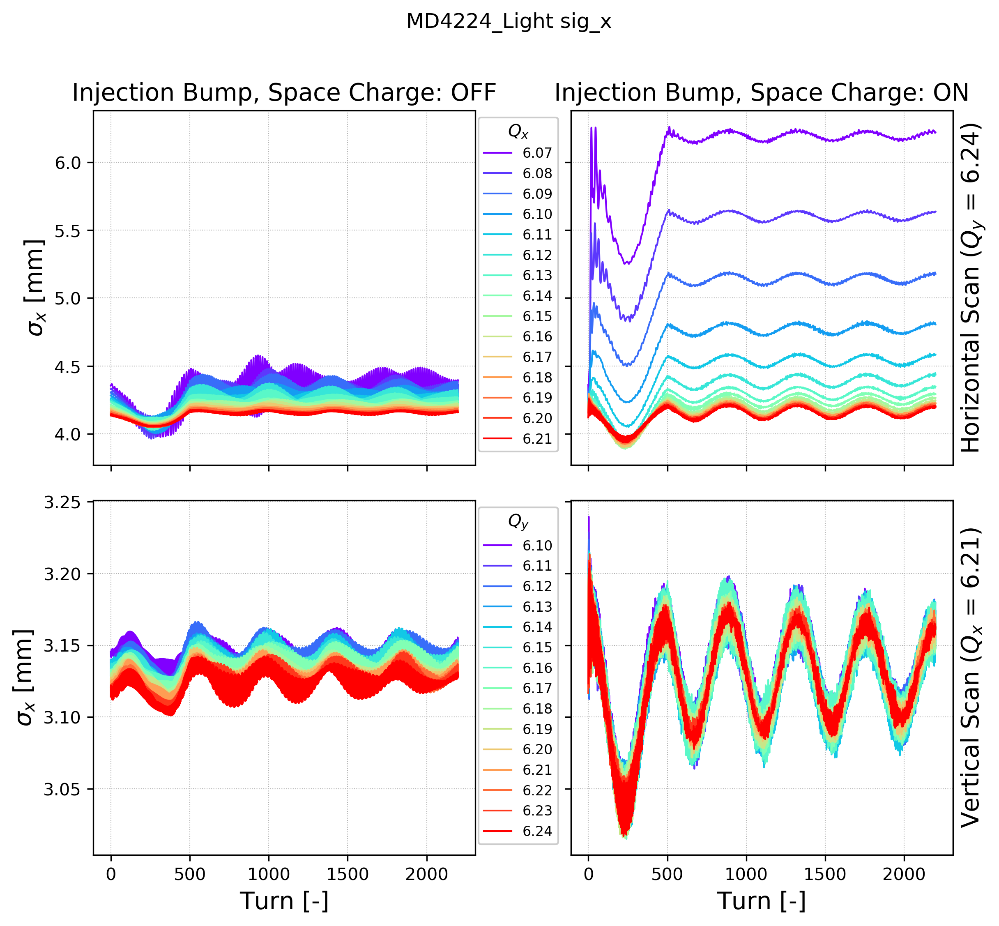

In [14]:
full_labels = False
range_unit = 'mm'
round_sig_limit = 2
parameter = 'sig_x'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_x$ [mm]');
ax3.set_ylabel(r'$\sigma_x$ [mm]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) +  ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) +  ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()  

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_xp  =  0.153  range =  0.0138  =  8.97 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_xp  =  0.149  range =  0.0119  =  8.01 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_xp  =  0.147  range =  0.0104  =  7.11 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_xp  =  0.146  range =  0.00936  =  6.43 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_xp  =  0.143  range =  0.0089  =  6.2 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_xp  =  0.143  range =  0.00831  =  5.81 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_xp  =  0.142  range =  0.00808  =  5.67 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_xp  =  0.141  r

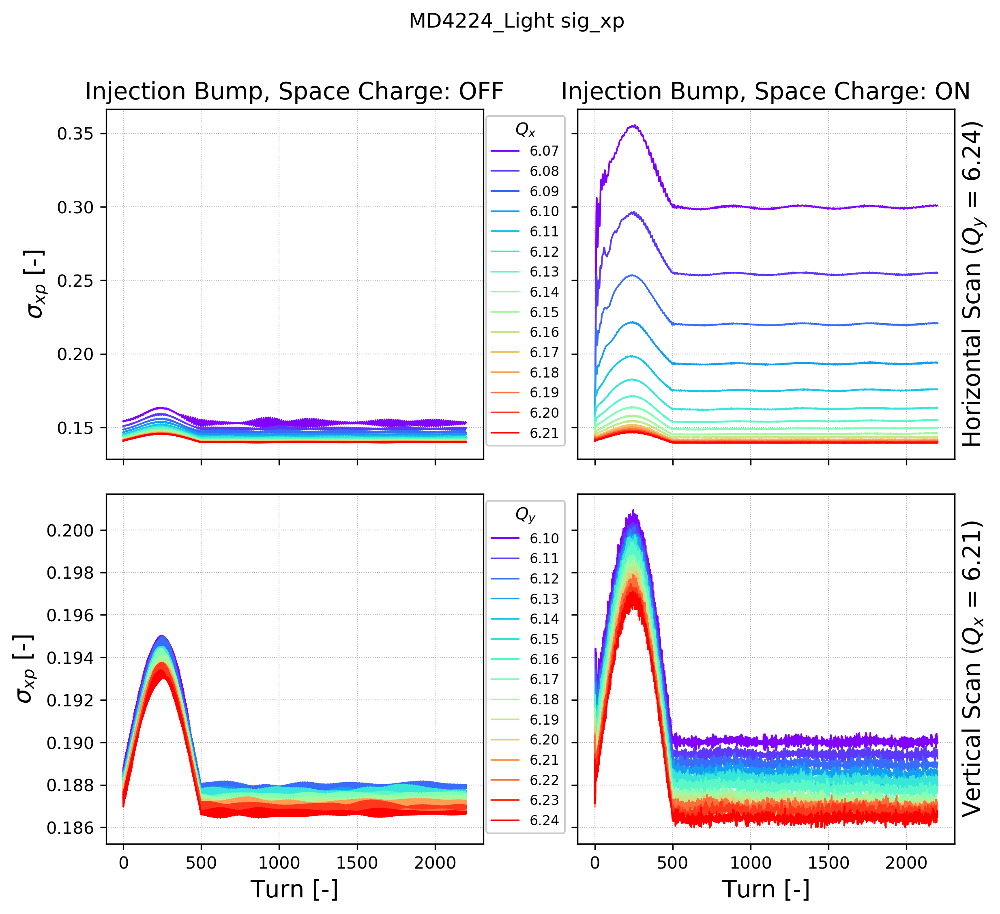

In [15]:
full_labels = False
range_unit = ''
round_sig_limit = 2
parameter = 'sig_xp'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_{xp}$ [-]');
ax3.set_ylabel(r'$\sigma_{xp}$ [-]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_y  =  2.27  range =  0.0883  =  3.88 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_y  =  2.28  range =  0.0872  =  3.83 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_y  =  2.27  range =  0.087  =  3.83 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_y  =  2.27  range =  0.089  =  3.93 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_y  =  2.27  range =  0.0907  =  4.0 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_y  =  2.27  range =  0.0866  =  3.81 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_y  =  2.27  range =  0.088  =  3.87 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_y  =  2.27  range =  0.0873  =  3.8

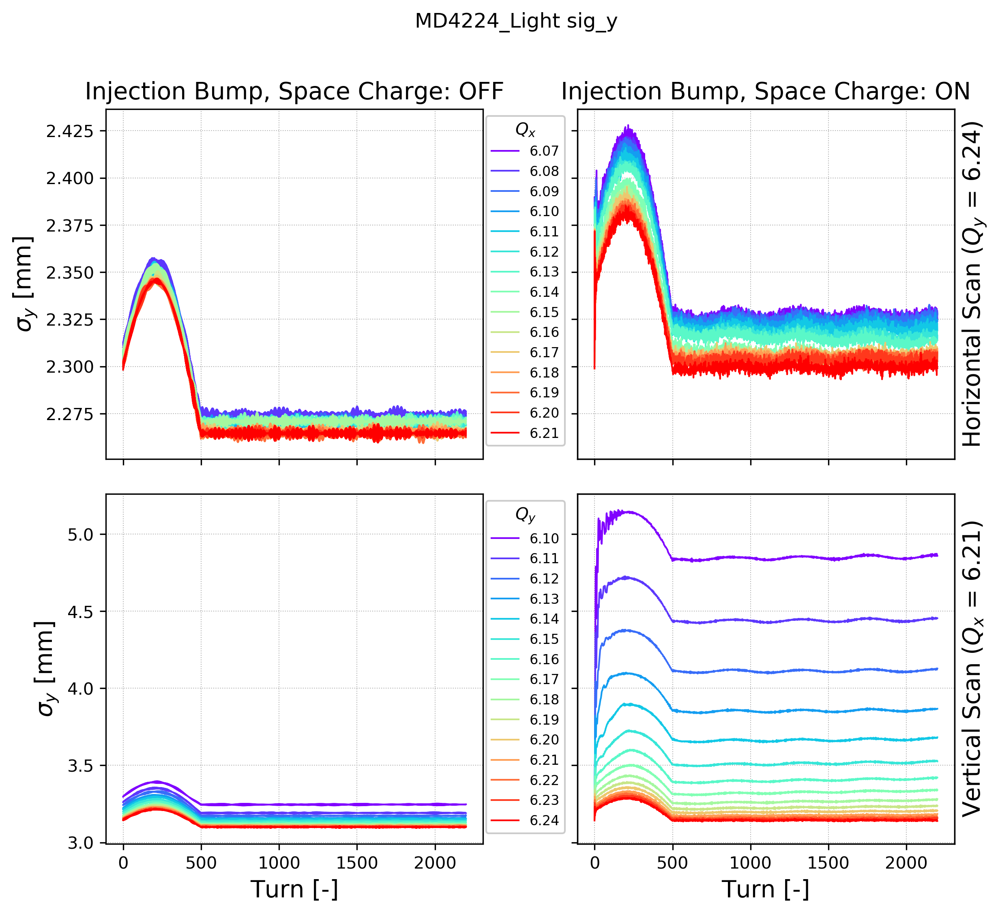

In [16]:
full_labels = False
range_unit = 'mm'
round_sig_limit = 2
parameter = 'sig_y'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_y$ [mm]');
ax3.set_ylabel(r'$\sigma_y$ [mm]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_yp  =  0.193  range =  0.00679  =  3.52 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_yp  =  0.193  range =  0.00667  =  3.45 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_yp  =  0.193  range =  0.00665  =  3.45 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_yp  =  0.193  range =  0.00681  =  3.53 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_yp  =  0.193  range =  0.00694  =  3.59 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_yp  =  0.193  range =  0.00664  =  3.44 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_yp  =  0.193  range =  0.00674  =  3.49 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_yp  =  0.1

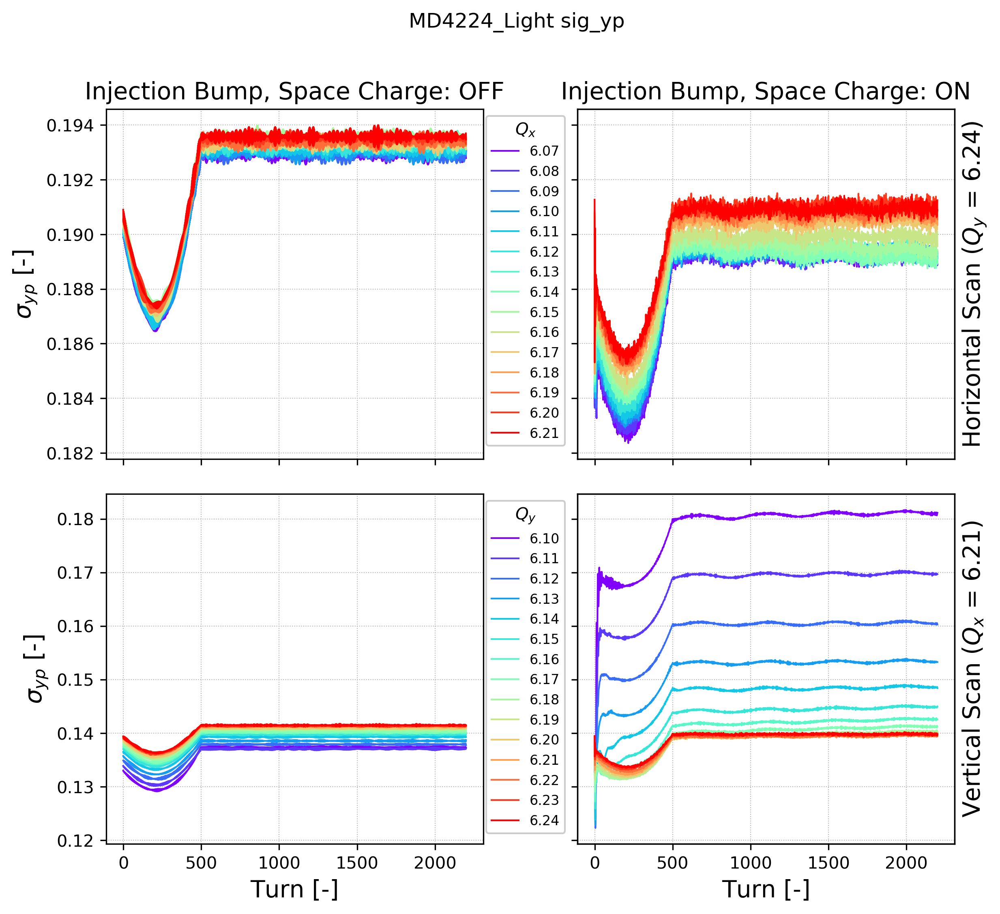

In [17]:
full_labels = False
range_unit = ''
round_sig_limit = 2
parameter = 'sig_yp'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_{yp}$ [-]');
ax3.set_ylabel(r'$\sigma_{yp}$ [-]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  beta_x  =  19.9  range =  3.45  =  17.4 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  beta_x  =  20.5  range =  3.03  =  14.8 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  beta_x  =  20.8  range =  2.69  =  12.9 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  beta_x  =  21.1  range =  2.47  =  11.7 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  beta_x  =  21.4  range =  2.31  =  10.8 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  beta_x  =  21.6  range =  2.17  =  10.0 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  beta_x  =  21.7  range =  2.1  =  9.65 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  beta_x  =  21.9  range =  1.97  =  8.99 %
I

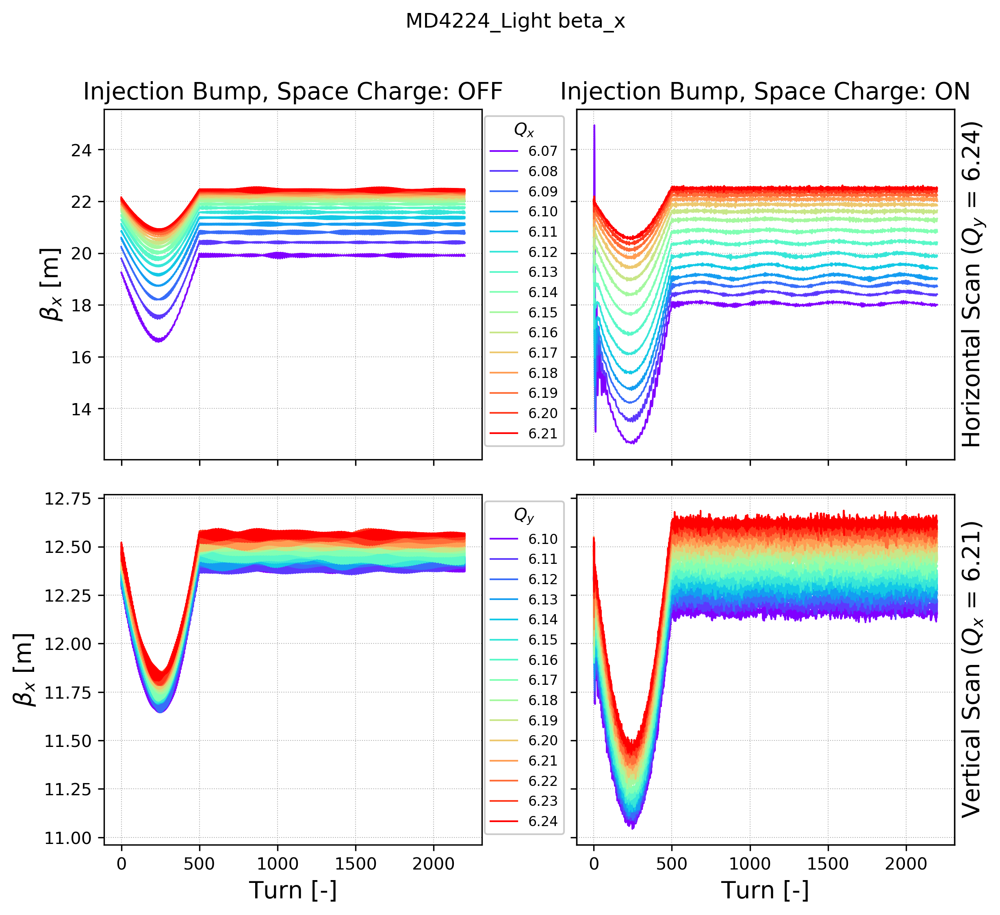

In [18]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'beta_x'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\beta_x$ [m]');
ax3.set_ylabel(r'$\beta_x$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    
ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  beta_y  =  11.8  range =  0.933  =  7.9 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  beta_y  =  11.8  range =  0.92  =  7.79 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  beta_y  =  11.8  range =  0.918  =  7.77 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  beta_y  =  11.7  range =  0.94  =  8.0 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  beta_y  =  11.8  range =  0.958  =  8.13 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  beta_y  =  11.8  range =  0.913  =  7.75 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  beta_y  =  11.8  range =  0.927  =  7.87 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  beta_y  =  11.8  range =  0.92  =  7.82

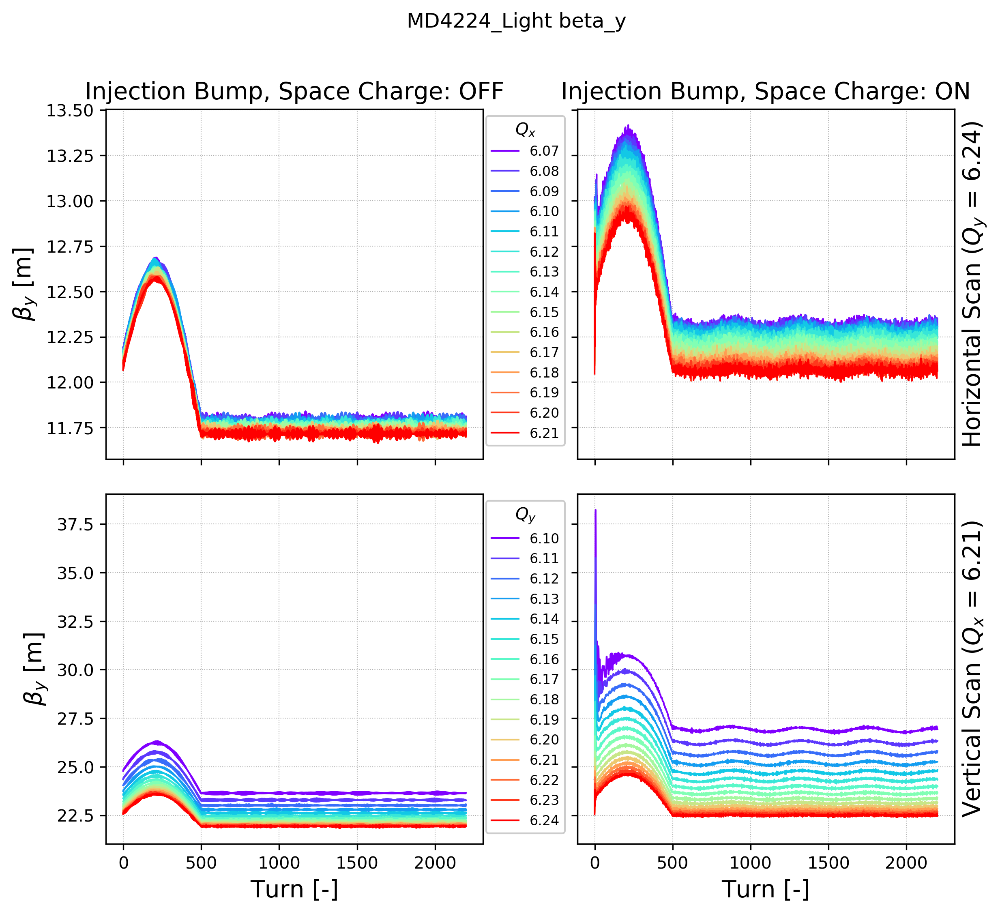

In [19]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'beta_y'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\beta_y$ [m]');
ax3.set_ylabel(r'$\beta_y$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  D_x  =  3.76  range =  0.704  =  18.7 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  D_x  =  3.66  range =  0.546  =  14.9 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  D_x  =  3.4  range =  0.436  =  12.8 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  D_x  =  3.44  range =  0.396  =  11.5 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  D_x  =  3.46  range =  0.314  =  9.08 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  D_x  =  3.27  range =  0.331  =  10.1 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  D_x  =  3.37  range =  0.302  =  8.96 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  D_x  =  3.3  range =  0.167  =  5.05 %
Injection Bump, Sp

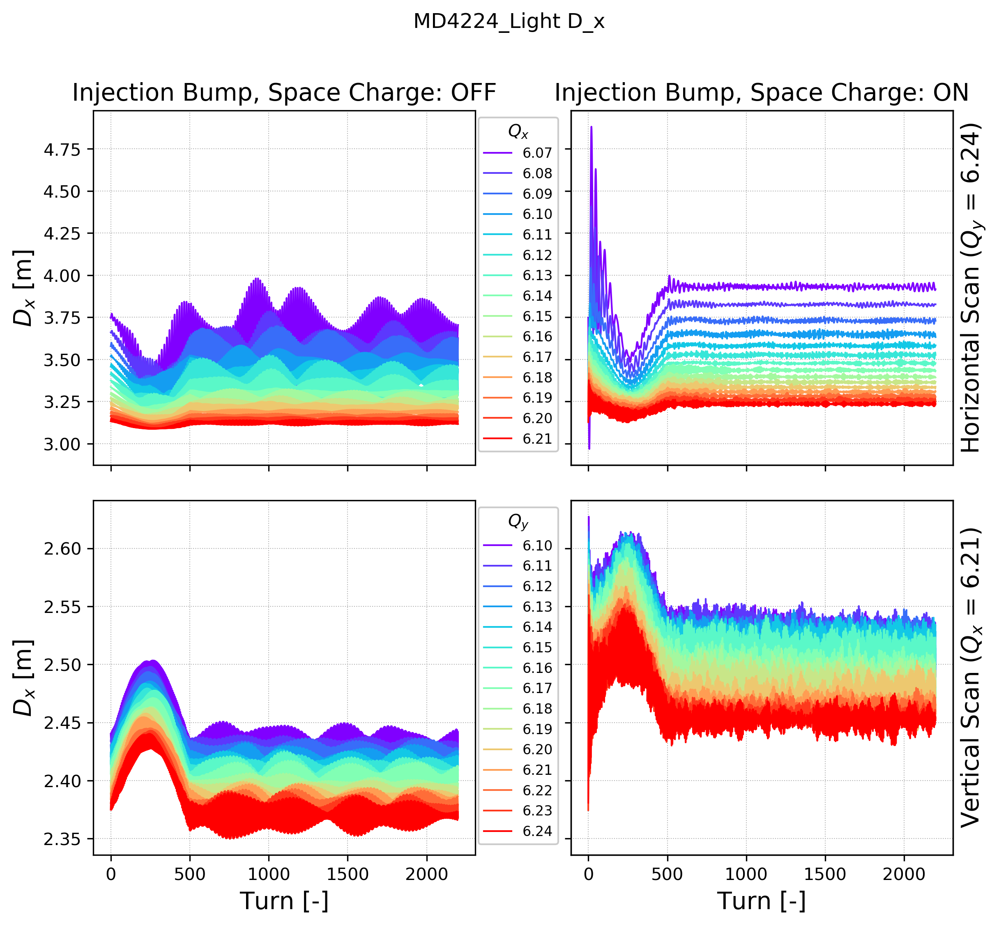

In [20]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'D_x'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$D_x$ [m]');
ax3.set_ylabel(r'$D_x$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  D_y  =  0.0017  range =  0.0208  =  1230.0 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  D_y  =  0.00535  range =  0.0224  =  418.0 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  D_y  =  -0.00316  range =  0.0134  =  -422.0 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  D_y  =  0.00114  range =  0.0244  =  2130.0 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  D_y  =  -0.00105  range =  0.0164  =  -1560.0 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  D_y  =  -0.000857  range =  0.0197  =  -2300.0 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  D_y  =  0.000279  range =  0.0183  =  6550.0 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  D_y  =  0

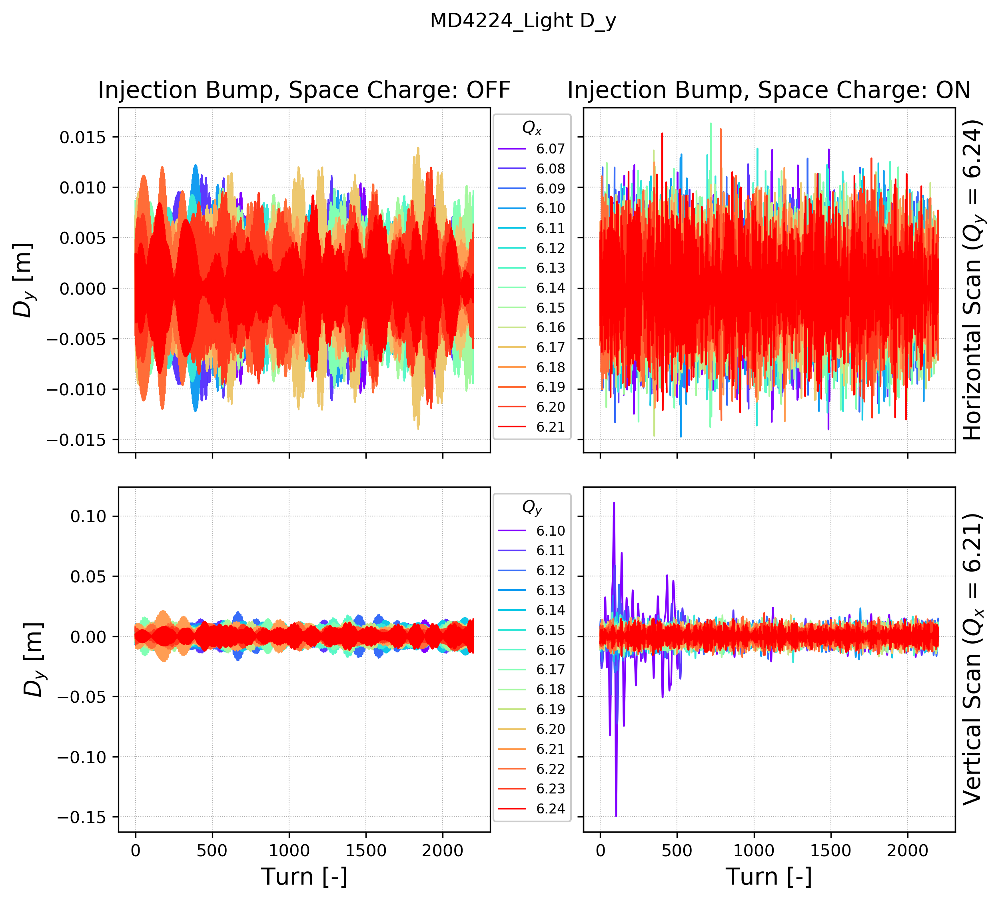

In [21]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'D_y'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$D_y$ [m]');
ax3.set_ylabel(r'$D_y$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  dpp_rms  =  0.87  range =  0.0164  =  1.89 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  dpp_rms  =  0.87  range =  0.0163  =  1.88 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  dpp_rms  =  0.869  range =  0.0149  =  1.71 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  dpp_rms  =  0.87  range =  0.016  =  1.84 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  dpp_rms  =  0.87  range =  0.0152  =  1.75 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  dpp_rms  =  0.87  range =  0.0162  =  1.87 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  dpp_rms  =  0.871  range =  0.0123  =  1.41 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  dpp_rms  =  0.87  ra

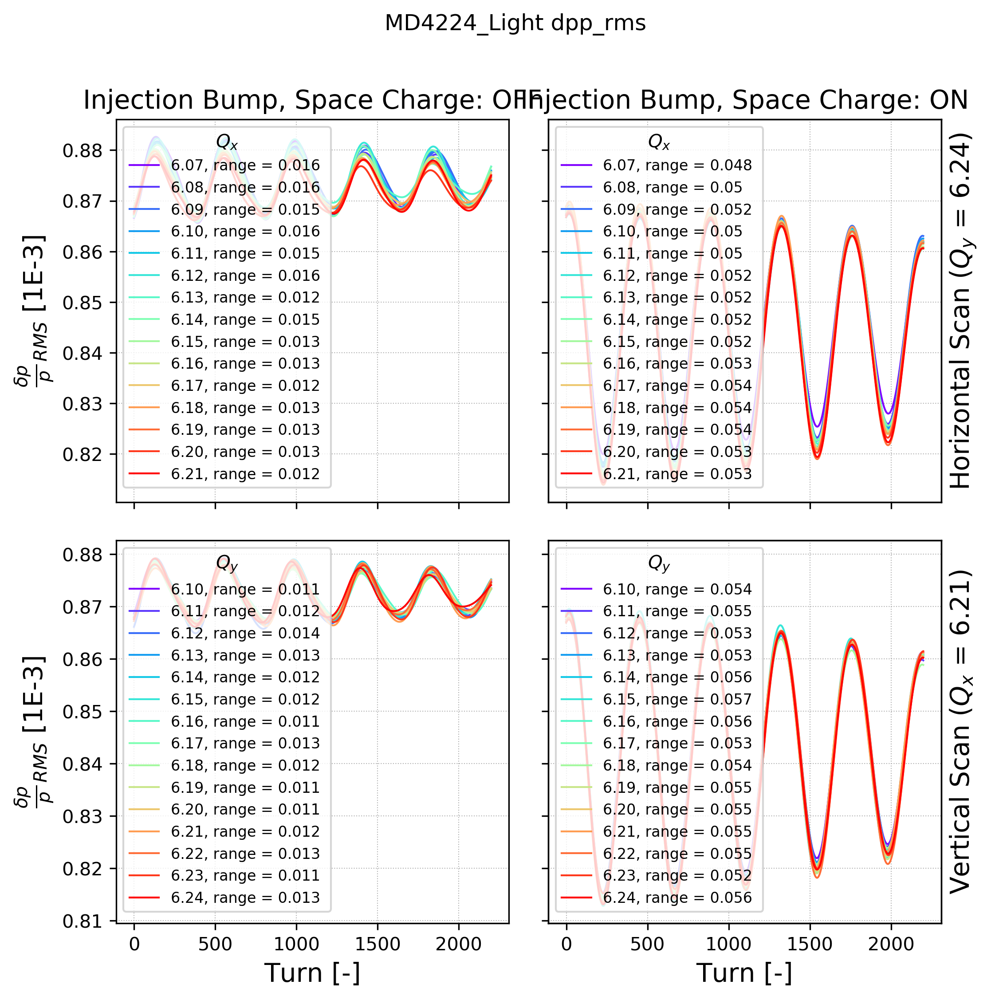

In [22]:
full_labels = True
range_unit = ''
round_sig_limit = 2
parameter = 'dpp_rms'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\frac{\delta p}{p}_{RMS}$ [1E-3]');
ax3.set_ylabel(r'$\frac{\delta p}{p}_{RMS}$ [1E-3]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  bunchlength  =  134.0  range =  2.44  =  1.83 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  bunchlength  =  134.0  range =  2.46  =  1.84 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  bunchlength  =  134.0  range =  2.25  =  1.68 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  bunchlength  =  134.0  range =  2.41  =  1.8 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  bunchlength  =  134.0  range =  2.29  =  1.71 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  bunchlength  =  134.0  range =  2.43  =  1.81 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  bunchlength  =  134.0  range =  1.84  =  1.38 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  b

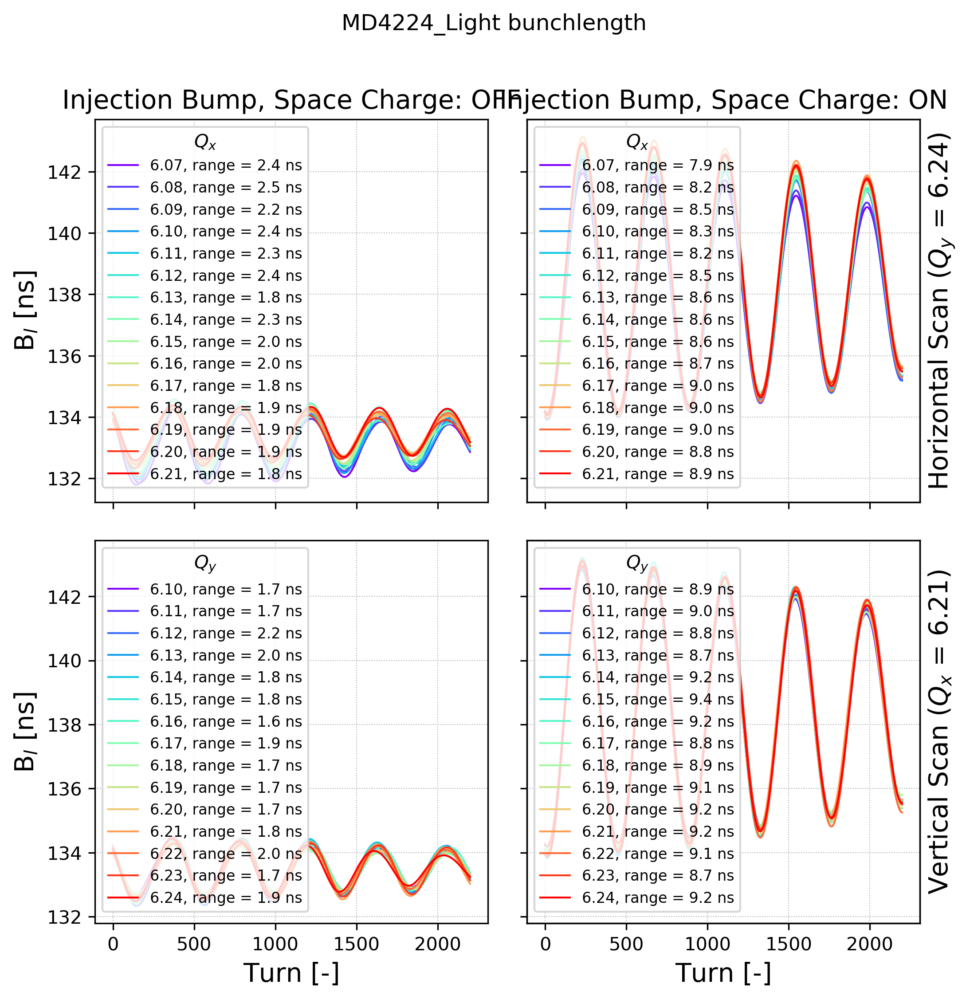

In [23]:
full_labels = True
range_unit = 'ns'
round_sig_limit = 2
parameter = 'bunchlength'
multi1 = 1E9

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'B$_l$ [ns]');
ax3.set_ylabel(r'B$_l$ [ns]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_z  =  9.18  range =  0.168  =  1.83 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_z  =  9.19  range =  0.169  =  1.84 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_z  =  9.2  range =  0.154  =  1.68 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_z  =  9.19  range =  0.165  =  1.8 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_z  =  9.19  range =  0.157  =  1.71 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_z  =  9.21  range =  0.167  =  1.81 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_z  =  9.18  range =  0.126  =  1.38 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_z  =  9.2  range =  0.158  =  1.72 %
Inj

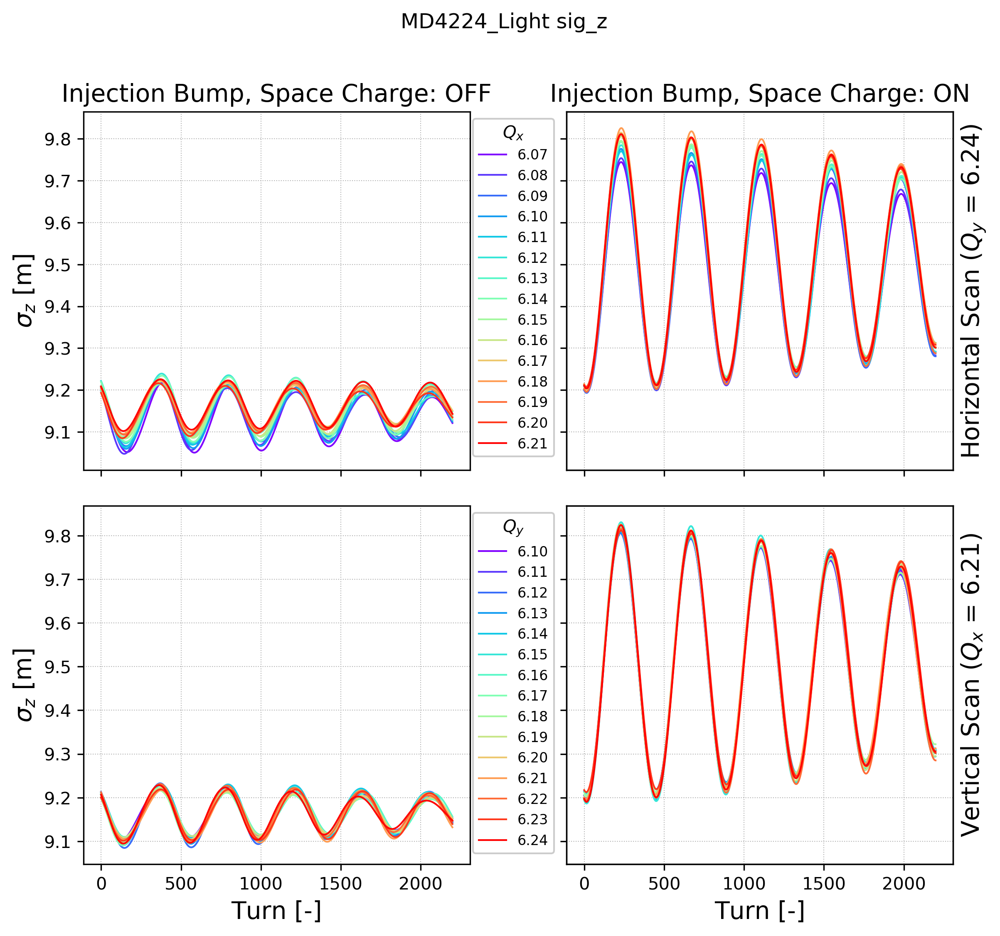

In [24]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'sig_z'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\sigma_z$ [m]');
ax3.set_ylabel(r'$\sigma_z$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_dE  =  1.71  range =  0.0322  =  1.89 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_dE  =  1.71  range =  0.0321  =  1.88 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_dE  =  1.71  range =  0.0292  =  1.71 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_dE  =  1.71  range =  0.0313  =  1.84 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_dE  =  1.71  range =  0.0298  =  1.75 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_dE  =  1.71  range =  0.0319  =  1.87 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_dE  =  1.71  range =  0.0241  =  1.41 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_dE  =  1.71  range =  0.

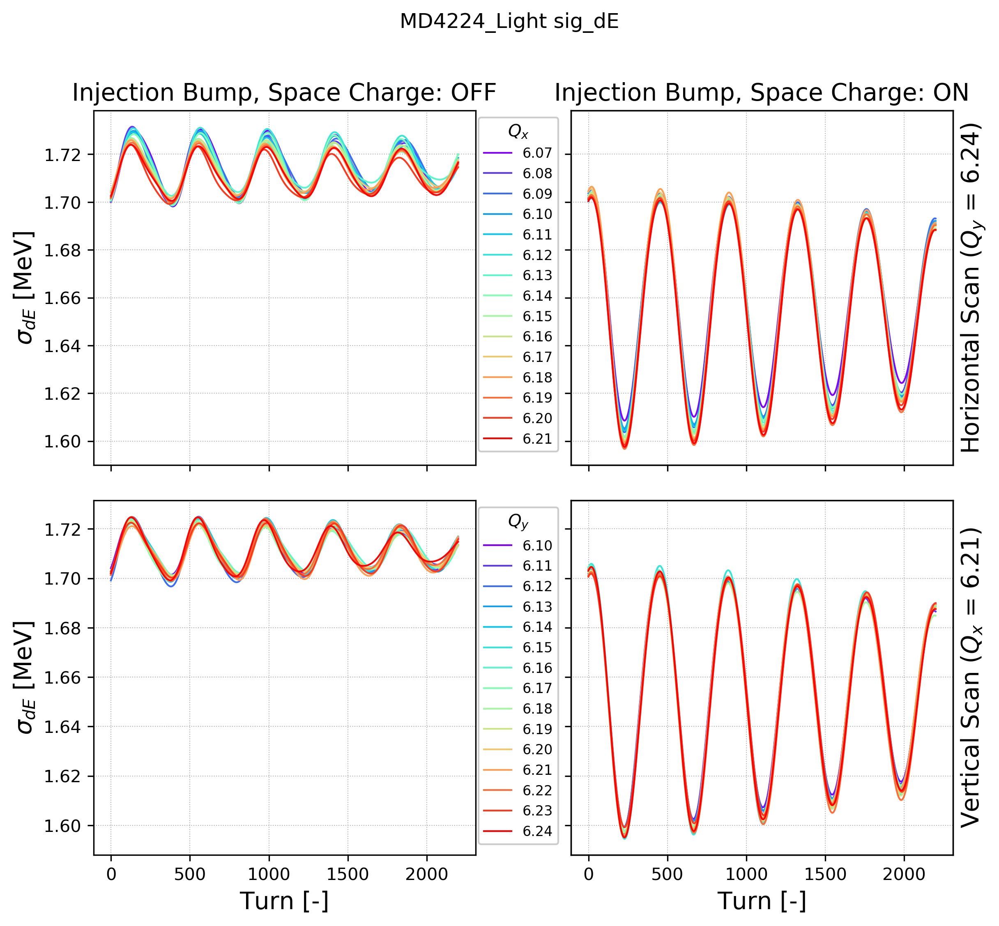

In [25]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'sig_dE'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\sigma_{dE}$ [MeV]');
ax3.set_ylabel(r'$\sigma_{dE}$ [MeV]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  eps_z  =  0.717  range =  0.00122  =  0.17 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  eps_z  =  0.717  range =  0.00138  =  0.193 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  eps_z  =  0.718  range =  0.0013  =  0.182 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  eps_z  =  0.718  range =  0.00128  =  0.179 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  eps_z  =  0.718  range =  0.00131  =  0.183 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  eps_z  =  0.719  range =  0.00132  =  0.183 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  eps_z  =  0.718  range =  0.00133  =  0.185 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  eps_z  =  0.718 

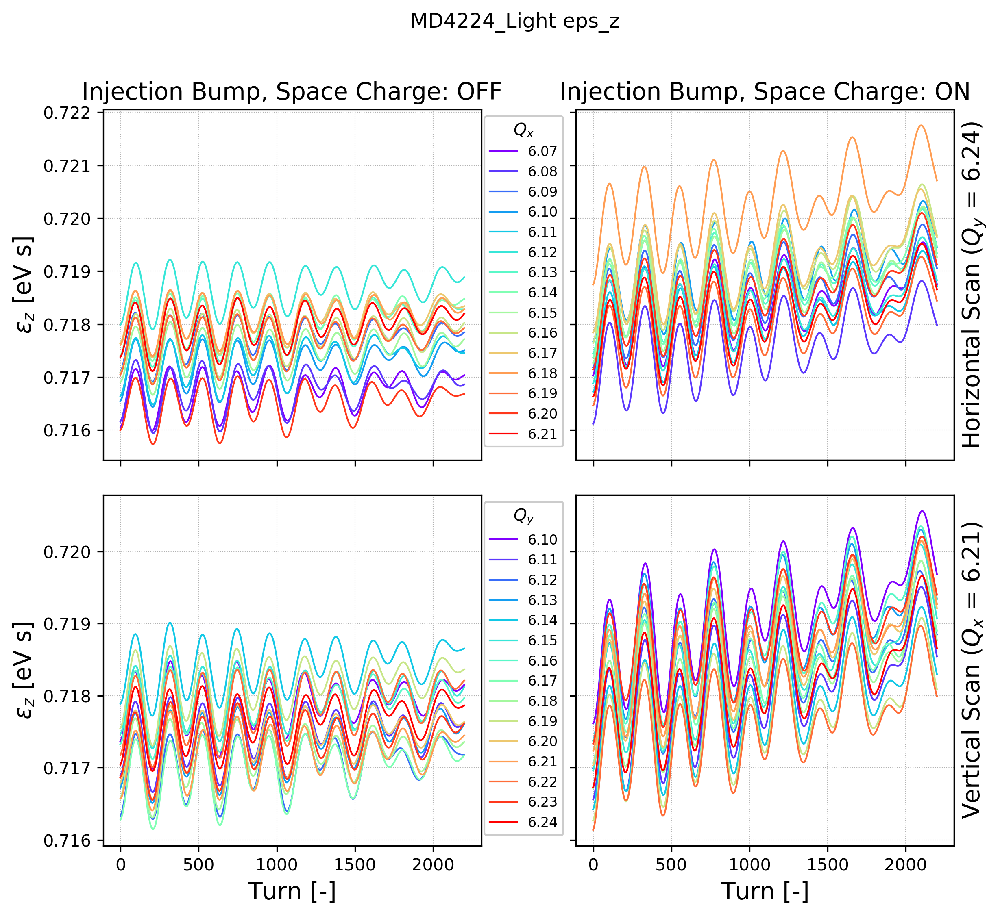

In [26]:
full_labels = False
range_unit = 'eV s'
round_sig_limit = 2
parameter = 'eps_z'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_z$ [eV s]');
ax3.set_ylabel(r'$\epsilon_z$ [eV s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_x  =  1.01  range =  0.0105  =  1.04 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_x  =  1.0  range =  0.00325  =  0.325 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_x  =  1.0  range =  0.00657  =  0.655 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_x  =  1.0  range =  0.0037  =  0.368 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_x  =  1.0  range =  0.00168  =  0.168 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_x  =  1.0  range =  0.00348  =  0.348 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_x  =  1.0  range =  0.00125  =  0.125 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_x  =  0.998  range

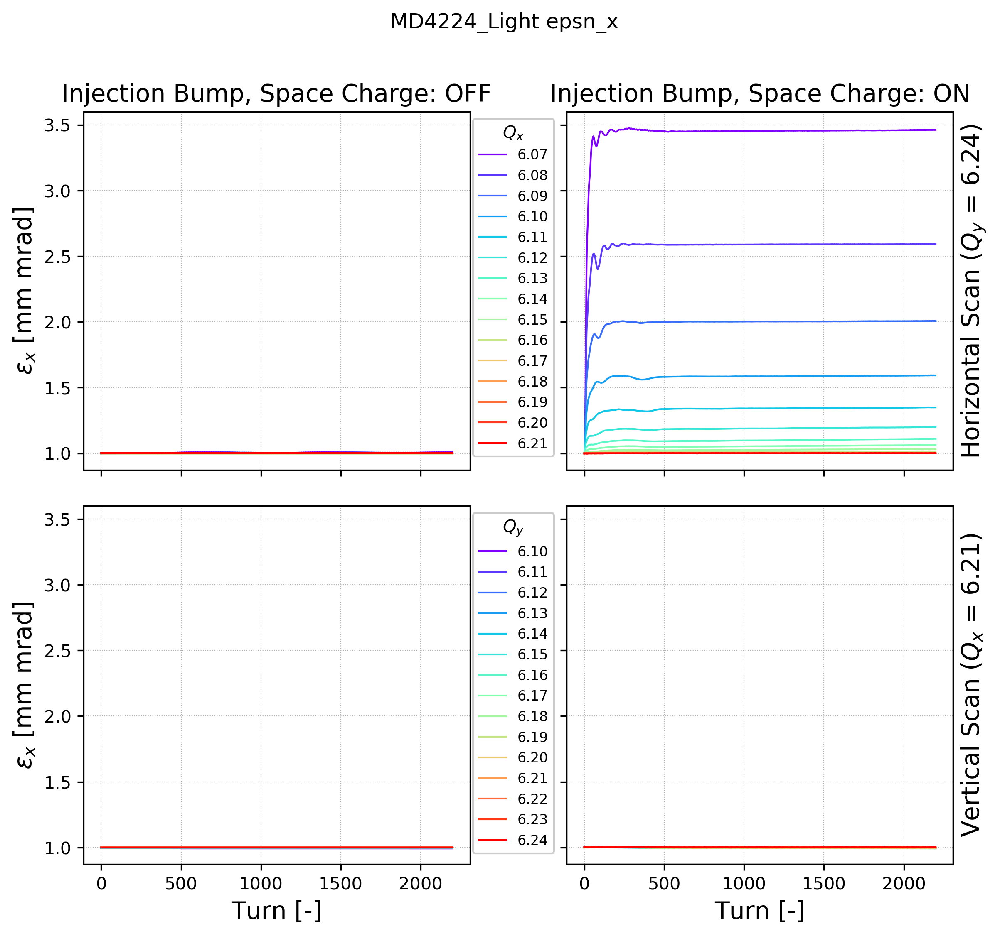

In [27]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2
parameter = 'epsn_x'
multi1 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  0.999  range =  3.64e-05  =  0.00365 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_y  =  1.0  range =  3.13e-05  =  0.00312 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  0.999  range =  4.52e-05  =  0.00453 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_y  =  0.999  range =  3.58e-05  =  0.00359 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  0.999  range =  3.95e-05  =  0.00395 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_y  =  1.0  range =  4.24e-05  =  0.00424 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  1.0  range =  4.15e-05  =  0.00414 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 A

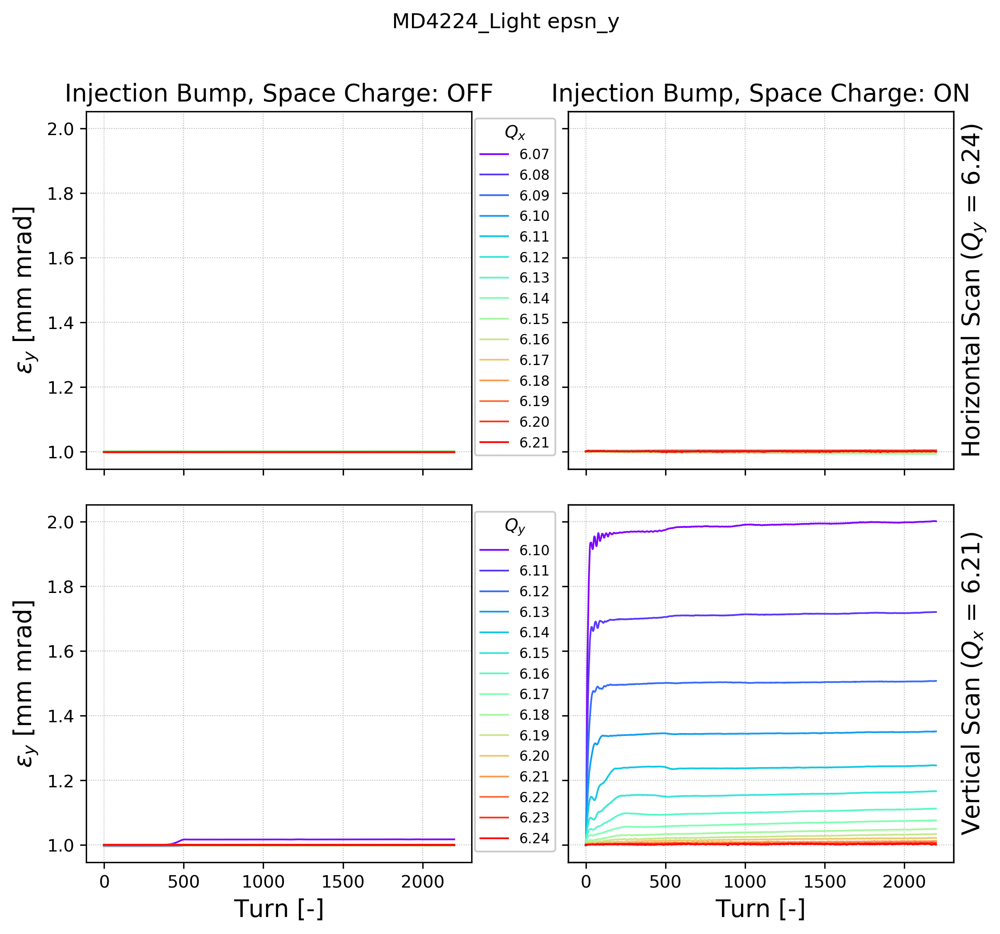

In [35]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2
parameter = 'epsn_y'
multi1 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(0.95, 2.75)
ax1.set_ylim(ax3.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  1.0  range =  0.00527  =  0.525 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_y  =  1.0  range =  0.00164  =  0.163 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  1.0  range =  0.00328  =  0.328 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_y  =  1.0  range =  0.00185  =  0.185 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  0.999  range =  0.000842  =  0.0843 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_y  =  1.0  range =  0.00175  =  0.175 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  1.0  range =  0.000625  =  0.0624 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_y  =  1.0 

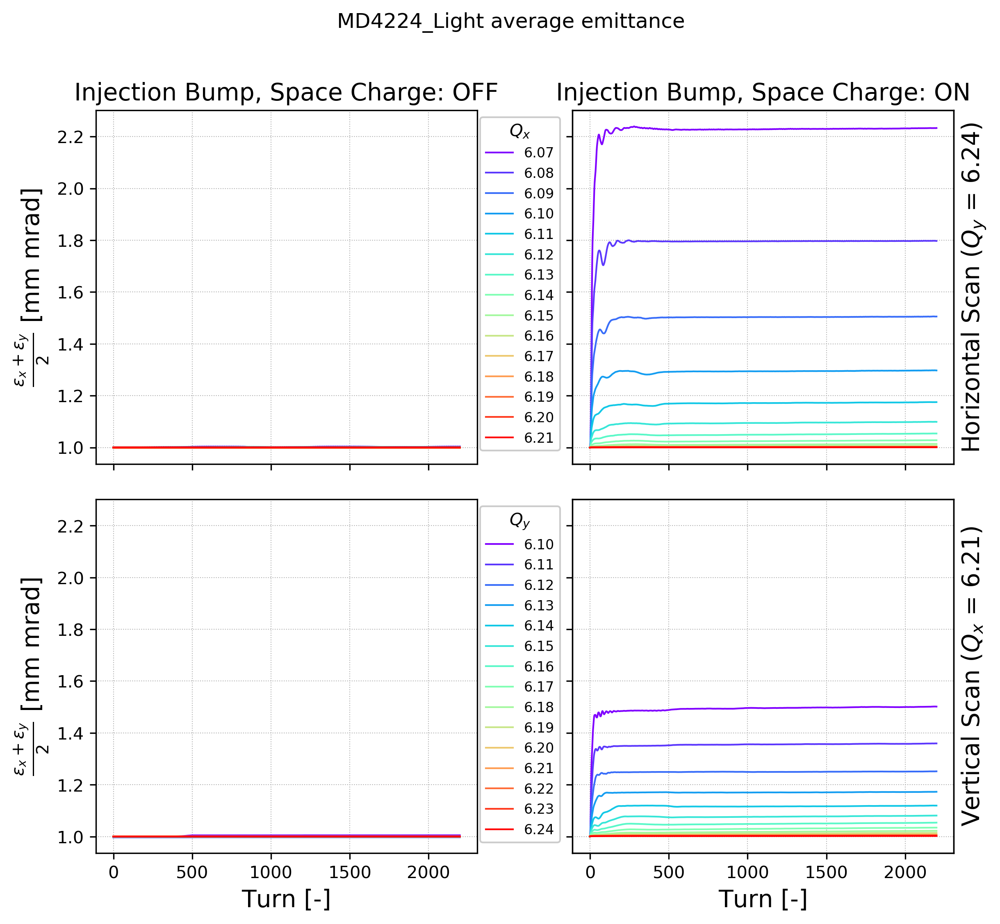

In [29]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2

parameter1 = 'epsn_x'
multi1 = 1E6
parameter2 = 'epsn_y'
multi2 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' average emittance'

fig.suptitle(tit)

ax1.set_ylabel(r'$\frac{\epsilon_x + \epsilon_y}{2}$ [mm mrad]');
ax3.set_ylabel(r'$\frac{\epsilon_x + \epsilon_y}{2}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    x = np.array(dd1[key]['turn'][0])
    y = np.array((dd1[key][parameter1][0]*multi1 + dd1[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
      

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    x = np.array(dd2[key]['turn'][0])
    y = np.array((dd2[key][parameter1][0]*multi1 + dd2[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
 
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    x = np.array(dd3[key]['turn'][0])
    y = np.array((dd3[key][parameter1][0]*multi1 + dd3[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    x = np.array(dd4[key]['turn'][0])
    y = np.array((dd4[key][parameter1][0]*multi1 + dd4[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_average_emittance.png'
plt.savefig(savename); 

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_x  =  1.01  range =  0.0105  =  1.04 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_x  =  1.0  range =  0.00325  =  0.325 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_x  =  1.0  range =  0.00657  =  0.655 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_x  =  1.0  range =  0.0037  =  0.368 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_x  =  1.0  range =  0.00168  =  0.168 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_x  =  1.0  range =  0.00348  =  0.348 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_x  =  1.0  range =  0.00125  =  0.125 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_x  =  0.998  range

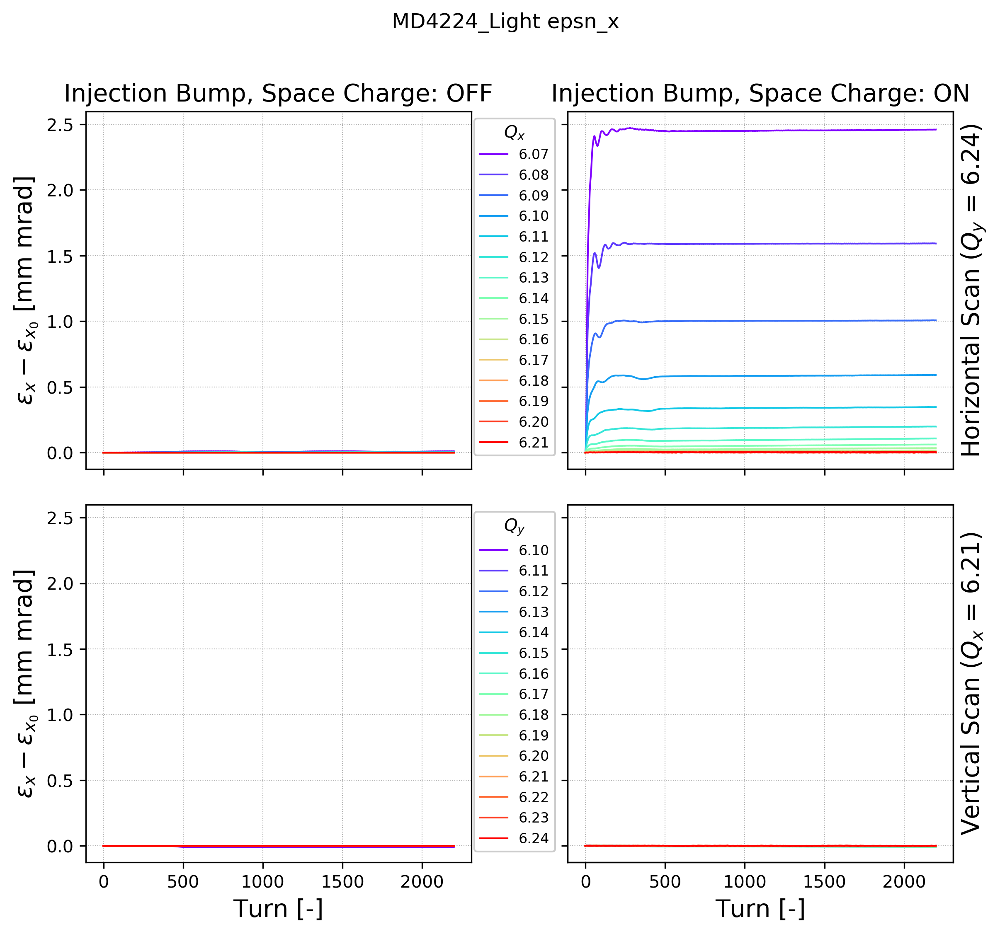

In [30]:
parameter = 'epsn_x'
multi1 = 1E6

plt.rcParams['figure.figsize'] = [9.0, 8.0]
hspace = 0.1
vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\epsilon_x-\epsilon_{x_0}$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_x-\epsilon_{x_0}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');


colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], ((dd1[key][parameter][0]*multi1)-(dd1[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
        print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
        c_it = c_it + 1;       

ax1.grid(lw=0.5, ls=':');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], ((dd2[key][parameter][0]*multi1)-(dd2[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);  
        av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
        print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;        
ax2.grid(lw=0.5, ls=':');
ax2.set_title(title_1)

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], ((dd3[key][parameter][0]*multi1)-(dd3[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
        print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax3.grid(lw=0.5, ls=':');
ax1.set_title(title_2)

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], ((dd4[key][parameter][0]*multi1)-(dd4[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
        print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax4.grid(lw=0.5, ls=':');

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);


for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '_growth_cf.png'
plt.savefig(savename, dpi = 800);

Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  0.999  range =  3.64e-05  =  0.00365 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_y  =  1.0  range =  3.13e-05  =  0.00312 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  0.999  range =  4.52e-05  =  0.00453 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_y  =  0.999  range =  3.58e-05  =  0.00359 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  0.999  range =  3.95e-05  =  0.00395 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_y  =  1.0  range =  4.24e-05  =  0.00424 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  1.0  range =  4.15e-05  =  0.00414 %
Injection Bump, Space Charge: OFF   Horizontal Scan ($Q_y$ = 6.24)   6.14 A

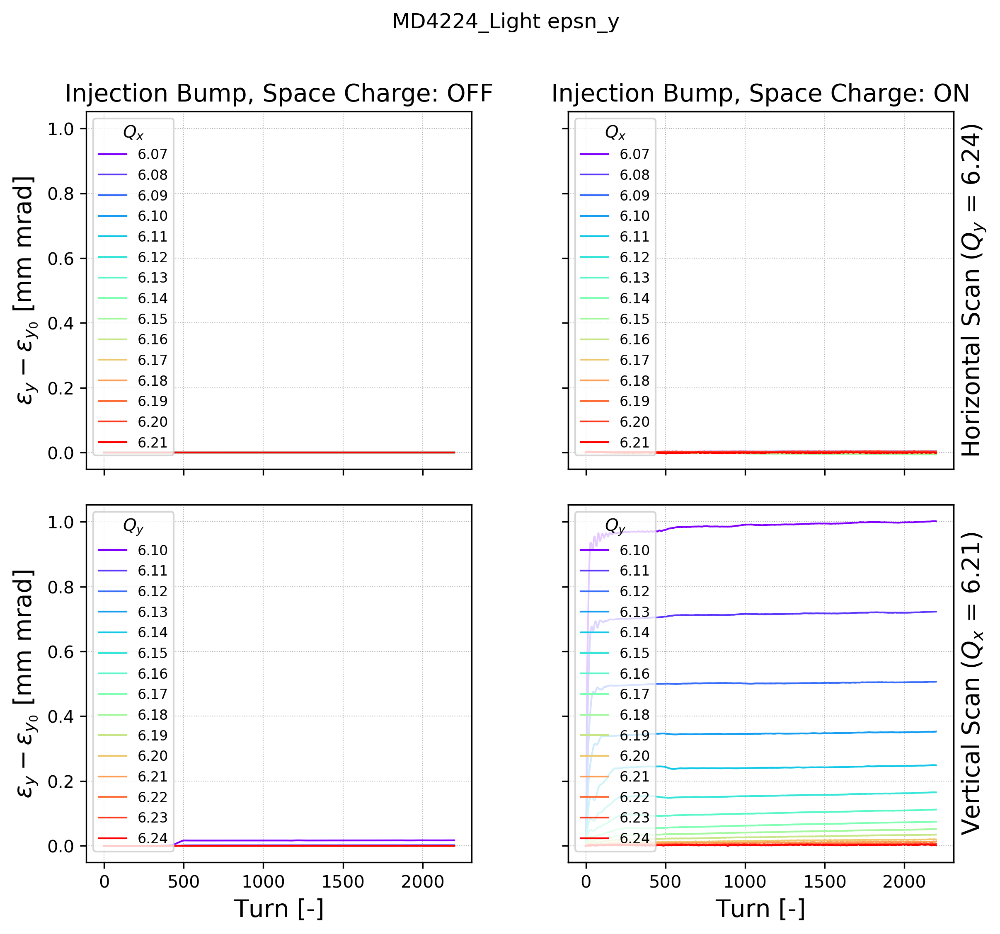

In [31]:
full_labels = True
range_unit = 'mm mrad'
round_sig_limit = 2

parameter = 'epsn_y'
multi1 = 1E6

plt.rcParams['figure.figsize'] = [9.0, 8.0]
hspace = 0.1
vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\epsilon_y-\epsilon_{y_0}$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_y-\epsilon_{y_0}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');


colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], ((dd1[key][parameter][0]*multi1)-(dd1[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
        print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
        c_it = c_it + 1;       

ax1.grid(lw=0.5, ls=':');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], ((dd2[key][parameter][0]*multi1)-(dd2[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);  
        av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
        print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;        
ax2.grid(lw=0.5, ls=':');
ax2.set_title(title_1)

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], ((dd3[key][parameter][0]*multi1)-(dd3[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
        print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax3.grid(lw=0.5, ls=':');
ax1.set_title(title_2)

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], ((dd4[key][parameter][0]*multi1)-(dd4[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
        print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax4.grid(lw=0.5, ls=':');

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.set_ylim(ax3.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);


for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '_growth_cf.png'
plt.savefig(savename, dpi = 800);